# Phishing Detection

As each coin has two sides, so does technology. On one hand, with the advancement in technology the lives are getting better, on the other hand, the ill use of technology is also increasing. The suspicious activities are increasing ranging from dos attacks, phishing, hacking etc. In this hackathon, we are concerned with the increasing phishing attacks.


Typically, Phishing is a type of social engineering where an attacker sends a fraudulent (e.g., spoofed, fake, or otherwise deceptive) message designed to trick a person into revealing sensitive information to the attacker or to deploy malicious software on the victim's infrastructure like ransomware.


**Task:**

The candidates have to read the data and create a model based on the data analysis to identify if the website is legitimate or a phishing website. The Result will be determined by the two values [1, -1] where 1 represent the legitimate and -1 represents phishing


**Data Description:**

The data set consists of 30 features of a phishing website. The value of attributes can be [1, 0, -1] except the key value which is incremental.

*  1 represents the legitimate
*  0 represents suspicious
* -1 represents phishing

## Submission
1. Output file generated by the model.
2. Source Code file or .ipynb file or Report
3. Report or Presentation with model explanation
4. Demonstration Video (If Possible)

## Evaluation Metric
- Correctness of code / Score Received
- Source or .ipynb file Submitted
- Report or Presentation with model explanation

In [1]:
!wget https://www.techgig.com/files/DataScienceData/344575/Phising_Training_Dataset.csv
!wget https://www.techgig.com/files/DataScienceData/344575/Phising_Testing_Dataset.csv
!wget https://www.techgig.com/files/DataScienceData/344575/sample_submission.csv

--2022-06-03 07:14:06--  https://www.techgig.com/files/DataScienceData/344575/Phising_Training_Dataset.csv
Resolving www.techgig.com (www.techgig.com)... 69.192.217.241, 69.192.217.153, 2600:1417:7800::1728:f093, ...
Connecting to www.techgig.com (www.techgig.com)|69.192.217.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘Phising_Training_Dataset.csv’

Phising_Training_Da     [ <=>                ] 685.46K  --.-KB/s    in 0.08s   

2022-06-03 07:14:07 (8.75 MB/s) - ‘Phising_Training_Dataset.csv’ saved [701909]

--2022-06-03 07:14:07--  https://www.techgig.com/files/DataScienceData/344575/Phising_Testing_Dataset.csv
Resolving www.techgig.com (www.techgig.com)... 69.192.217.241, 69.192.217.153, 2600:1417:7800::1728:f093, ...
Connecting to www.techgig.com (www.techgig.com)|69.192.217.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘Phising_Testing_Dataset.csv’



In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
!pip install sweetviz
import sweetviz as eda
import seaborn as sns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 4.3 MB/s 


In [3]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# set pandas options
pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)

# /content/drive/MyDrive/TechGig_HPE_ML_2022
root = "/content/drive/MyDrive/TechGig_HPE_ML_2022/%s"

from joblib import dump, load

# Data understanding

In [4]:
# read the data
train = pd.read_csv("./Phising_Training_Dataset.csv")
test = pd.read_csv("./Phising_Testing_Dataset.csv")

In [5]:
# shape
train.shape, test.shape

((8955, 32), (2100, 31))

## Look for datatype and null values

In [6]:
# info
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8955 entries, 0 to 8954
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   key                          8955 non-null   int64
 1   having_IP                    8955 non-null   int64
 2   URL_Length                   8955 non-null   int64
 3   Shortining_Service           8955 non-null   int64
 4   having_At_Symbol             8955 non-null   int64
 5   double_slash_redirecting     8955 non-null   int64
 6   Prefix_Suffix                8955 non-null   int64
 7   having_Sub_Domain            8955 non-null   int64
 8   SSLfinal_State               8955 non-null   int64
 9   Domain_registeration_length  8955 non-null   int64
 10  Favicon                      8955 non-null   int64
 11  port                         8955 non-null   int64
 12  HTTPS_token                  8955 non-null   int64
 13  Request_URL                  8955 non-null   int

* The dataset is clean

In [7]:
# train dataset9
train.head()

,key,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
0,12344,-1,1,1,1,-1,-1,-1,-1,-1,1,1,-1,1,-1,1,-1,-1,-1,0,1,1,1,1,-1,-1,-1,-1,1,1,-1,-1
1,12345,1,1,1,1,1,-1,0,1,-1,1,1,-1,1,0,-1,-1,1,1,0,1,1,1,1,-1,-1,0,-1,1,1,1,-1
2,12346,1,0,1,1,1,-1,-1,-1,-1,1,1,-1,1,0,-1,-1,-1,-1,0,1,1,1,1,1,-1,1,-1,1,0,-1,-1
3,12347,1,0,1,1,1,-1,-1,-1,1,1,1,-1,-1,0,0,-1,1,1,0,1,1,1,1,-1,-1,1,-1,1,-1,1,-1
4,12348,1,0,-1,1,1,-1,1,1,-1,1,1,1,1,0,0,-1,1,1,0,-1,1,-1,1,-1,-1,0,-1,1,1,1,1


In [8]:
# test dataset
test.head()

,key,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report
0,21338,1,1,1,1,1,1,-1,1,-1,1,1,1,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,-1,0,1
1,21339,1,-1,1,1,1,-1,0,-1,1,1,1,1,1,-1,-1,-1,1,1,0,1,1,1,1,-1,-1,0,-1,-1,0,1
2,21340,1,-1,1,1,1,-1,0,0,-1,-1,-1,1,-1,-1,-1,-1,-1,1,0,-1,-1,-1,-1,1,-1,1,-1,1,1,-1
3,21341,-1,-1,-1,1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,1,-1,-1,-1,1,-1,1,-1,-1,1,-1,1,-1,1,1,-1
4,21342,1,-1,1,1,1,-1,1,1,-1,1,1,1,1,0,1,-1,1,1,0,1,1,1,1,1,1,1,-1,1,0,1


In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2100 entries, 0 to 2099
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   key                          2100 non-null   int64
 1   having_IP                    2100 non-null   int64
 2   URL_Length                   2100 non-null   int64
 3   Shortining_Service           2100 non-null   int64
 4   having_At_Symbol             2100 non-null   int64
 5   double_slash_redirecting     2100 non-null   int64
 6   Prefix_Suffix                2100 non-null   int64
 7   having_Sub_Domain            2100 non-null   int64
 8   SSLfinal_State               2100 non-null   int64
 9   Domain_registeration_length  2100 non-null   int64
 10  Favicon                      2100 non-null   int64
 11  port                         2100 non-null   int64
 12  HTTPS_token                  2100 non-null   int64
 13  Request_URL                  2100 non-null   int

## Data Anatomy

- 30 Features
- `key` un-usable variable
- `Result` the target variable

In [10]:
# drop key column
train_key = train['key']
train.drop(columns=['key'], inplace=True)
train.head()

,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
0,-1,1,1,1,-1,-1,-1,-1,-1,1,1,-1,1,-1,1,-1,-1,-1,0,1,1,1,1,-1,-1,-1,-1,1,1,-1,-1
1,1,1,1,1,1,-1,0,1,-1,1,1,-1,1,0,-1,-1,1,1,0,1,1,1,1,-1,-1,0,-1,1,1,1,-1
2,1,0,1,1,1,-1,-1,-1,-1,1,1,-1,1,0,-1,-1,-1,-1,0,1,1,1,1,1,-1,1,-1,1,0,-1,-1
3,1,0,1,1,1,-1,-1,-1,1,1,1,-1,-1,0,0,-1,1,1,0,1,1,1,1,-1,-1,1,-1,1,-1,1,-1
4,1,0,-1,1,1,-1,1,1,-1,1,1,1,1,0,0,-1,1,1,0,-1,1,-1,1,-1,-1,0,-1,1,1,1,1


# Exploratery Data Analysis

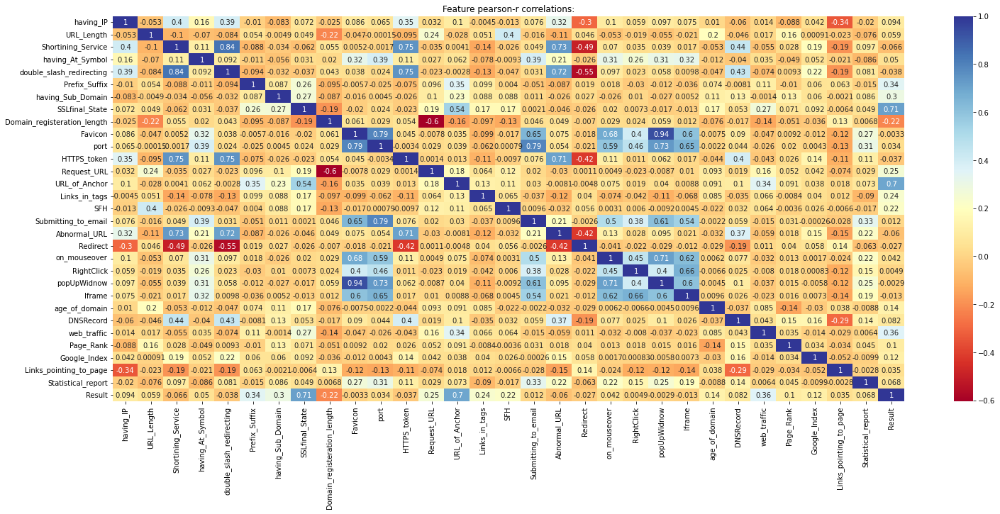

In [11]:
# correlation headmap
corr = train.corr()
plt.figure(figsize=[25, 10])
sns.heatmap(corr, annot=True, cmap="RdYlBu")
plt.title("Feature pearson-r correlations:")
plt.show()

- There are **9 features** is highly correlated with `Result`, target variable, feature
    1. `Prefix_Suffix`
    1. `having_Sub_Domain`
    1. `SSLfinal_State`
    1. `Domain_registeration_length`
    1. `Request_URL`
    1. `URL_of_Anchor`
    1. `Links_in_tags`
    1. `SFH`
    1. `web_traffic`
- Above features has higher potential to identify the `Result` variable accuratly.

                                             |          | [  0%]   00:00 -> (? left)


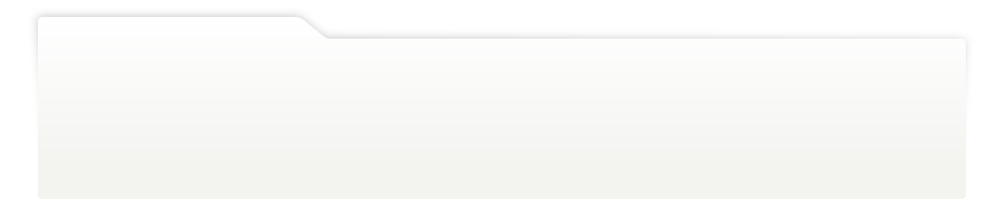
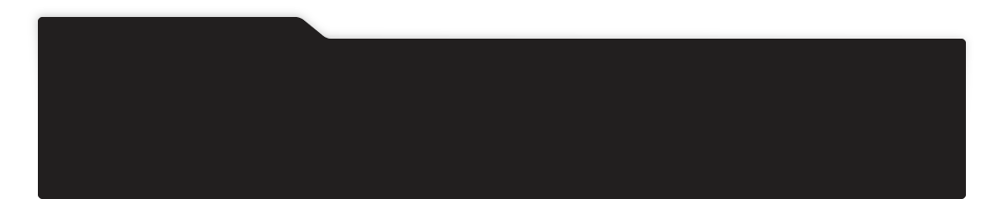
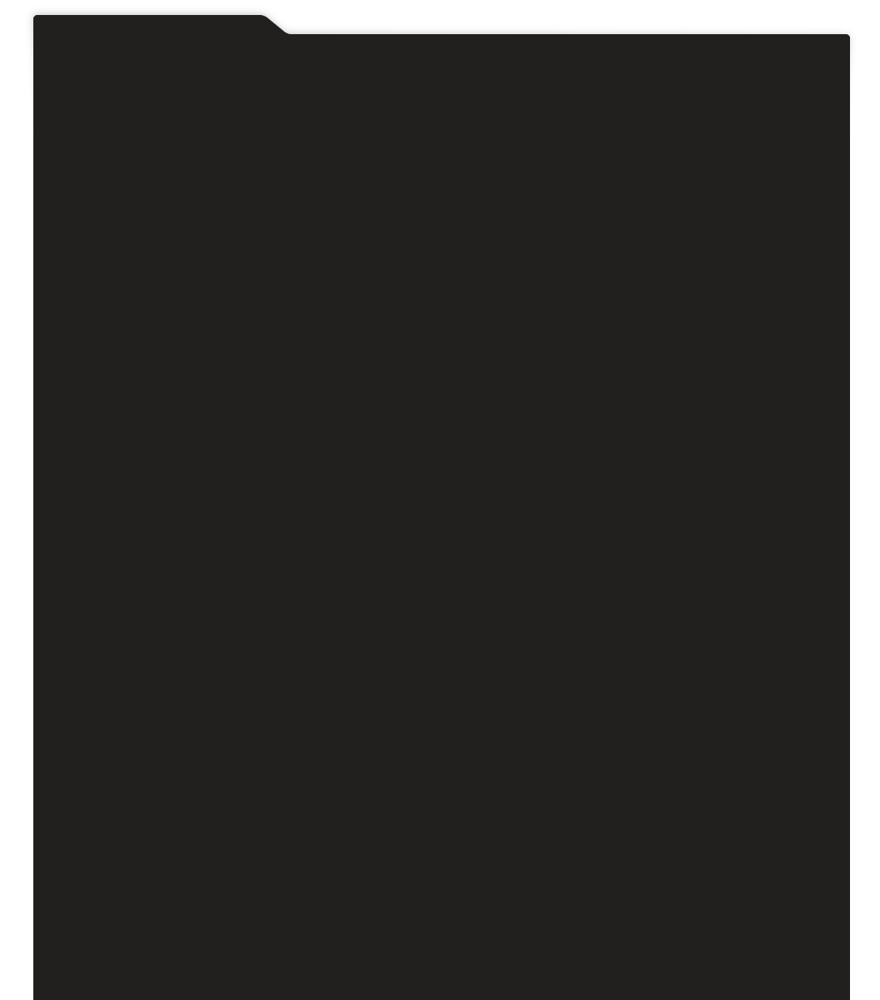
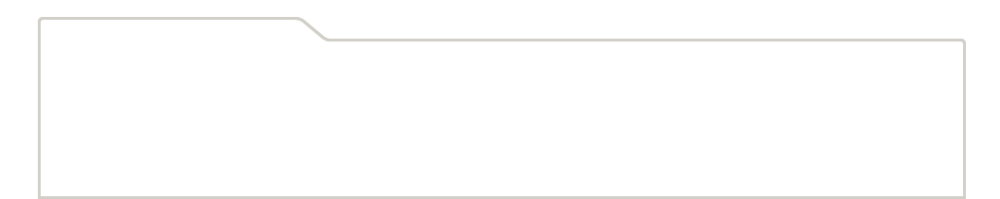
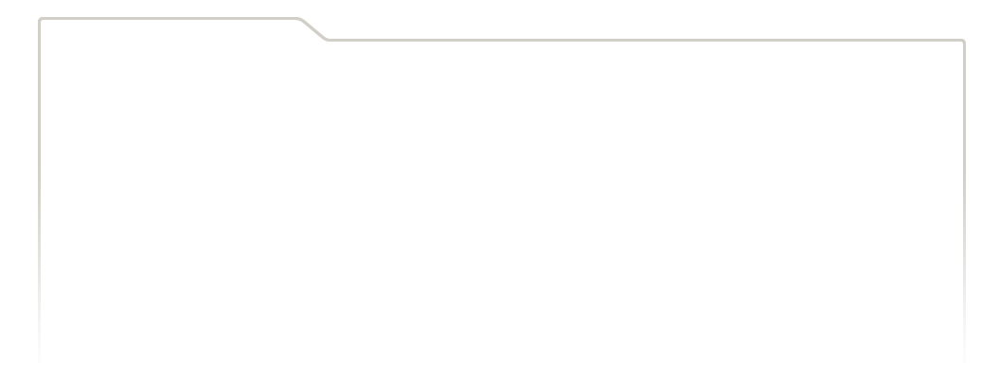
...
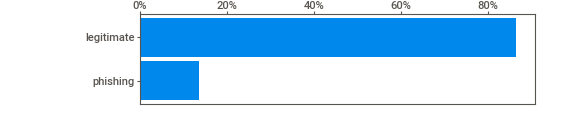
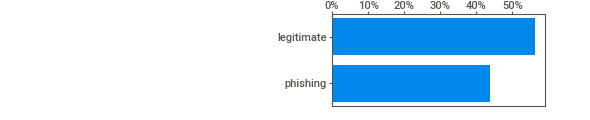
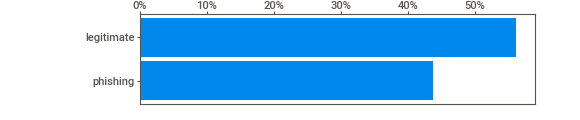
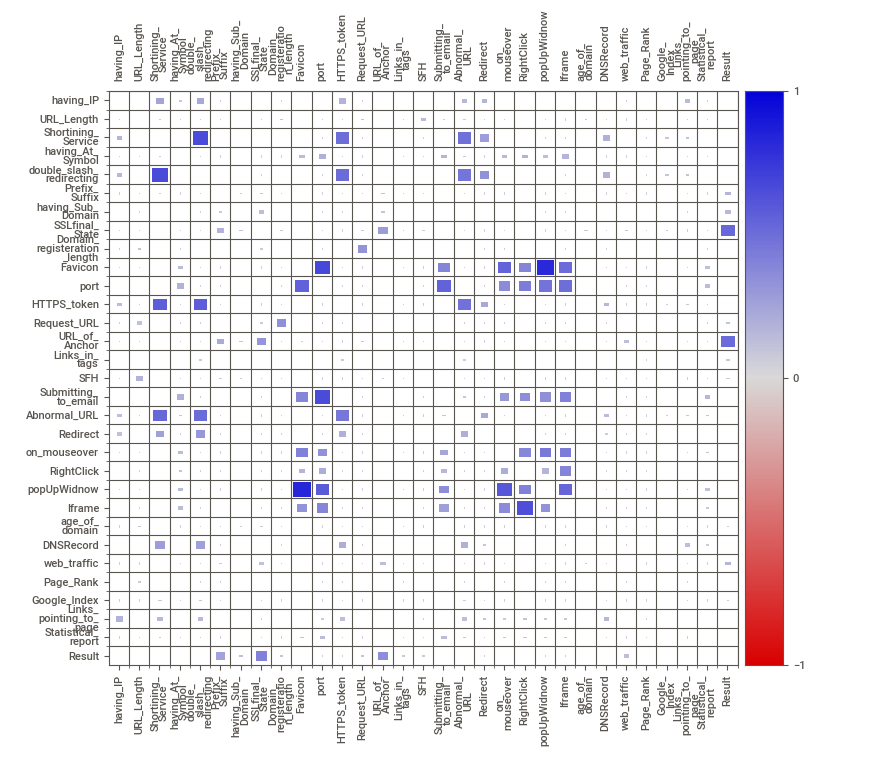
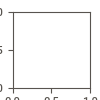

In [12]:
# sweetviz auto eda
my_report = eda.analyze(train.replace([-1, 0, 1], ["phishing", "suspicious", "legitimate"]))
my_report.show_notebook()

**Result:** Here we have `legitimate: 56%` and `phishing: 44%`. I would say this is a **nice balance** between the classes.


# Expected outcome

- As we can clearly understand that, we are dealing with a binary classification problem.

- Based on my understanding of the given problem we have build a model which can provide us the **lowest** `Recall` score.

# Prepaing Dataset

## Perform ordinal encoding to aid the training process

In [13]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline

## Define `Phising=1` and `Legitimate=0`

In [14]:
# conver (-1 to 1) and (1 to 0) [WARNING!! run this only once]
train["Result"] = train["Result"].apply(lambda x: 1 if x is -1 else 0)
train.head()

,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
0,-1,1,1,1,-1,-1,-1,-1,-1,1,1,-1,1,-1,1,-1,-1,-1,0,1,1,1,1,-1,-1,-1,-1,1,1,-1,1
1,1,1,1,1,1,-1,0,1,-1,1,1,-1,1,0,-1,-1,1,1,0,1,1,1,1,-1,-1,0,-1,1,1,1,1
2,1,0,1,1,1,-1,-1,-1,-1,1,1,-1,1,0,-1,-1,-1,-1,0,1,1,1,1,1,-1,1,-1,1,0,-1,1
3,1,0,1,1,1,-1,-1,-1,1,1,1,-1,-1,0,0,-1,1,1,0,1,1,1,1,-1,-1,1,-1,1,-1,1,1
4,1,0,-1,1,1,-1,1,1,-1,1,1,1,1,0,0,-1,1,1,0,-1,1,-1,1,-1,-1,0,-1,1,1,1,0


In [15]:
# prepare variables
X = train.drop(columns=["Result"])
y = train.Result

In [16]:
# encoder pipeline
enc = Pipeline(steps=[
    ("encoder", OrdinalEncoder()),
])
# perform ordinal encoding
enc_arr = enc.fit_transform(X)
X = X.copy()
# encode
X.loc[:,:] = enc_arr
X.head()

,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report
0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0
1,1.0,2.0,1.0,1.0,1.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,1.0
2,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,2.0,0.0,1.0,1.0,0.0
3,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,2.0,0.0,1.0,0.0,1.0
4,1.0,1.0,0.0,1.0,1.0,0.0,2.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,1.0


In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

In [18]:
# stop here

# Model Building (Logistic Regression)

## Model-1: Logistic Regression
L1 and L2 regularization

In [19]:
# Logistic Regression with 3-fold cross validation
lrcv = LogisticRegressionCV(cv=5, 
                            random_state=0, 
                            max_iter=1000,
                            class_weight="balanced",
                            penalty="elasticnet", solver="saga", l1_ratios=[0.01, 0.001],
                            scoring='roc_auc')

In [20]:
# train the model
result = lrcv.fit(X, y)

In [21]:
result.scores_[1.0].shape

(5, 10, 2)

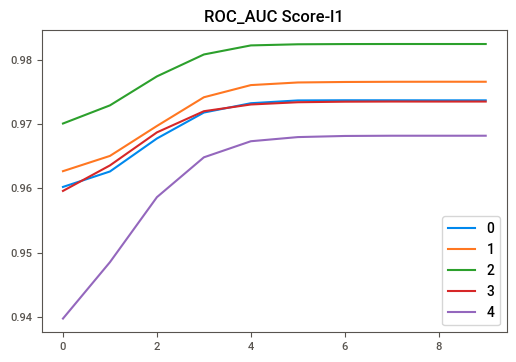

In [22]:
pd.DataFrame(result.scores_[1.0][:,:,0].T).plot.line()
plt.title("ROC_AUC Score-l1")
plt.show()

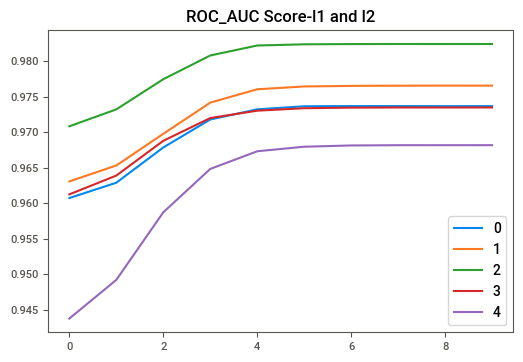

In [23]:
pd.DataFrame(result.scores_[1.0][:,:,1].T).plot.line()
plt.title("ROC_AUC Score-l1 and l2")
plt.show()

## Model-02: Logistic Regression
L1 and L2 regularization with 11 folds

In [24]:
# Logistic Regression with 11 folds
lrcv = LogisticRegressionCV(cv=11, 
                            random_state=0, 
                            max_iter=1000,
                            class_weight="balanced",
                            penalty="elasticnet", solver="saga", l1_ratios=[0.01, 0.001],
                            scoring='roc_auc')

In [25]:
# train the model
result2 = lrcv.fit(X, y)

In [26]:
result2.scores_[1.0].shape

(11, 10, 2)

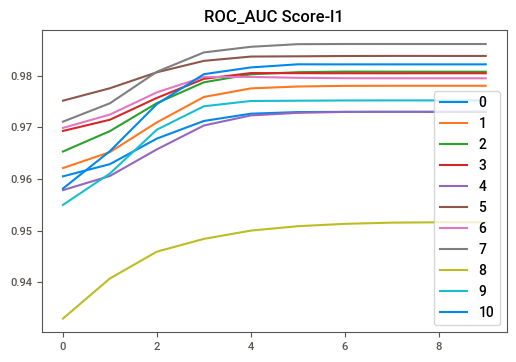

In [27]:
pd.DataFrame(result2.scores_[1.0][:,:,0].T).plot.line()
plt.title("ROC_AUC Score-l1")
plt.show()

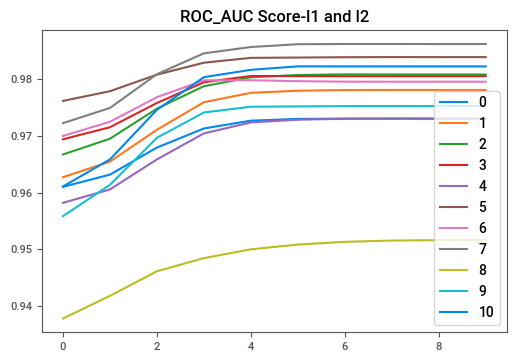

In [28]:
pd.DataFrame(result2.scores_[1.0][:,:,1].T).plot.line()
plt.title("ROC_AUC Score-l1 and l2")
plt.show()

In [29]:
# iteration taken at each cross-validation fold
result.n_iter_.max(), result2.n_iter_.max()

(562, 557)

In [30]:
# highest AUC-scores
result.scores_[1.0].max(), result2.scores_[1.0].max()

(0.9824246853657055, 0.9861145184240224)

## Summary

- As we can see above the `recall` score is around `0.9` and above.
- Therefore we can conclude that the liner model is not performing well.
- We shall try bit complex models 

# Model Building (Decision Trees)

## Model-04: Decision Tree
 With default parameters

In [31]:
# decision tree - 1
dt = DecisionTreeClassifier(random_state=0, class_weight='balanced')
result_dt1 = cross_val_score(dt, X, y, cv=5, scoring='roc_auc')

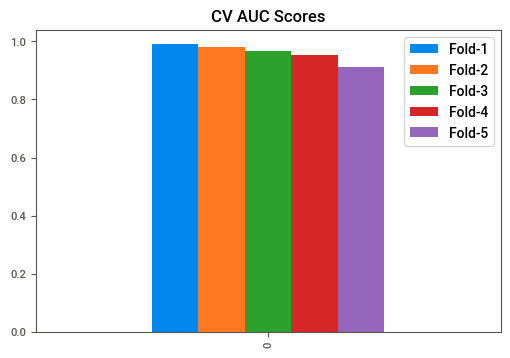

In [32]:
# ROC-AUC Values
scores = result_dt1
pd.DataFrame(scores.reshape(1, len(scores)), columns=["Fold-%d"%(i+1) for i in range(len(scores))]).plot.bar()
plt.title("CV AUC Scores")
plt.show()

## Model-04: Decision Tree
 11 - Folds

In [33]:
# decision tree - 1
dt2 = DecisionTreeClassifier(random_state=0, class_weight='balanced')
result_dt2 = cross_val_score(dt2, X, y, cv=11, scoring='roc_auc')

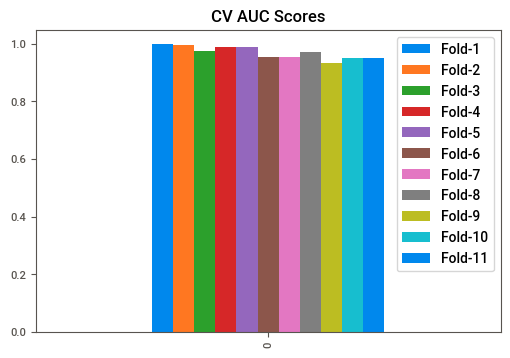

In [34]:
# ROC-AUC Values
scores = result_dt2
pd.DataFrame(scores.reshape(1, len(scores)), columns=["Fold-%d"%(i+1) for i in range(len(scores))]).plot.bar()
plt.title("CV AUC Scores")
plt.show()

## Summary

- As we can see above the last experiment with 11 folds is giving us the best ROC_AUC score.

- Let us understand which model it is

In [35]:
# highest AUC-scores
result.scores_[1.0].max(), result2.scores_[1.0].max(), result_dt1.max(), result_dt2.max()

(0.9824246853657055,
 0.9861145184240224,
 0.9899912626153904,
 0.9980306533093586)

- We can clearly see the last experiment with decision tree is giving us the best model so far w.r.t ROC_AUC score
- But this can be an indication of overfitting as well.
- Let us understand the facts below...

# Hyperparameter Tuning

In [36]:
# run  a plain decison tree and find tune the parameters
dt3 = DecisionTreeClassifier(random_state=0, class_weight='balanced')
result_dt3 = dt3.fit(X, y)

### Depth of the tree

In [37]:
# depth of the tree
dt3.get_depth()

24

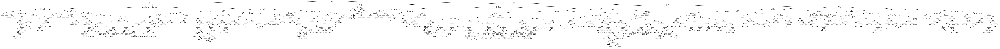

In [38]:
# plot the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=[400, 20])
plot_tree(dt3)
plt.show()

- As we can see above, this is a very complex model.
- Which is essentially remembering the entire trainig data.

## Grid Search

**Define grid search parameters**

In [39]:
# decision tree parameter grids
parameters = {'criterion':['gini', 'entropy'],
              'max_depth':[3, 4, 5, 6, 10, 15],
              'min_samples_leaf' : [5, 10, 15],
              'min_samples_split' : [10, 20, 30],
              'max_features' : ['auto', 'log2'],
            }

# prepare grid search object
dt4 = DecisionTreeClassifier(random_state=0, class_weight='balanced')
gridcv_dt = GridSearchCV(dt4, parameters, cv=11, 
                        scoring = ['roc_auc', 'accuracy', 'recall', 'precision'], refit='roc_auc',
                        error_score='raise', verbose=3, return_train_score=True)

In [40]:
# Perform the grid search
res_gridcv_dt = gridcv_dt.fit(X, y)
# save the model
dump(gridcv_dt, root % 'gridcv_dt.joblib')
dump(res_gridcv_dt, root % 'res_gridcv_dt.joblib')

Fitting 11 folds for each of 216 candidates, totalling 2376 fits
[CV 1/11] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10; accuracy: (train=0.906, test=0.893) precision: (train=0.889, test=0.895) recall: (train=0.896, test=0.857) roc_auc: (train=0.950, test=0.922) total time=   0.0s
[CV 2/11] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10; accuracy: (train=0.905, test=0.896) precision: (train=0.889, test=0.891) recall: (train=0.895, test=0.868) roc_auc: (train=0.950, test=0.927) total time=   0.0s
[CV 3/11] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10; accuracy: (train=0.906, test=0.894) precision: (train=0.891, test=0.877) recall: (train=0.894, test=0.882) roc_auc: (train=0.950, test=0.925) total time=   0.0s
[CV 4/11] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10; accuracy: (train=0.904, test=0.905) 

['/content/drive/MyDrive/TechGig_HPE_ML_2022/res_gridcv_dt.joblib']

In [41]:
# load the model
gridcv_dt = load(root % 'gridcv_dt.joblib')
res_gridcv_dt = load(root % 'res_gridcv_dt.joblib')

### Search Summary

In [42]:
# grid search result
cvdf = pd.DataFrame(gridcv_dt.cv_results_)
cvdf.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,params,split0_test_roc_auc,split1_test_roc_auc,split2_test_roc_auc,split3_test_roc_auc,split4_test_roc_auc,split5_test_roc_auc,split6_test_roc_auc,split7_test_roc_auc,split8_test_roc_auc,split9_test_roc_auc,split10_test_roc_auc,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,split0_train_roc_auc,split1_train_roc_auc,split2_train_roc_auc,split3_train_roc_auc,split4_train_roc_auc,split5_train_roc_auc,split6_train_roc_auc,split7_train_roc_auc,split8_train_roc_auc,split9_train_roc_auc,split10_train_roc_auc,mean_train_roc_auc,std_train_roc_auc,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,split5_test_accuracy,split6_test_accuracy,split7_test_accuracy,split8_test_accuracy,split9_test_accuracy,split10_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,split0_train_accuracy,split1_train_accuracy,split2_train_accuracy,split3_train_accuracy,split4_train_accuracy,split5_train_accuracy,split6_train_accuracy,split7_train_accuracy,split8_train_accuracy,split9_train_accuracy,split10_train_accuracy,mean_train_accuracy,std_train_accuracy,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,split5_test_recall,split6_test_recall,split7_test_recall,split8_test_recall,split9_test_recall,split10_test_recall,mean_test_recall,std_test_recall,rank_test_recall,split0_train_recall,split1_train_recall,split2_train_recall,split3_train_recall,split4_train_recall,split5_train_recall,split6_train_recall,split7_train_recall,split8_train_recall,split9_train_recall,split10_train_recall,mean_train_recall,std_train_recall,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,split5_test_precision,split6_test_precision,split7_test_precision,split8_test_precision,split9_test_precision,split10_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_train_precision,split1_train_precision,split2_train_precision,split3_train_precision,split4_train_precision,split5_train_precision,split6_train_precision,split7_train_precision,split8_train_precision,split9_train_precision,split10_train_precision,mean_train_precision,std_train_precision
0,0.011238,0.001300,0.013736,0.002246,gini,3,auto,5,10,"{'criterion': 'gini', 'max_depth': 3, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 10}",0.92214,0.926595,0.924946,0.934633,0.924076,0.970687,0.968586,0.960518,0.928018,0.942719,0.944958,0.940716,0.01747,181,0.950114,0.949754,0.950042,0.949083,0.94989,0.953606,0.953899,0.954774,0.957418,0.956443,0.956427,0.952859,0.003013,0.893252,0.895577,0.894349,0.905405,0.890663,0.909091,0.898034,0.888206,0.889435,0.91769,0.90172,0.898493,0.008747,163,0.905651,0.905417,0.90554,0.904434,0.905908,0.890677,0.891782,0.892765,0.892642,0.889817,0.891414,0.897823,0.006959,0.857143,0.868347,0.882353,0.885154,0.862745,0.907303,0.870787,0.882022,0.865169,0.910112,0.904494,0.881421,0.017906,104,0.896465,0.895342,0.893939,0.893659,0.895903,0.863394,0.867041,0.865919,0.867602,0.863114,0.863675,0.878732,0.014985,0.894737,0.890805,0.877437,0.897727,0.885057,0.887363,0.893372,0.865014,0.88,0.902507,0.875,0.886274,0.010602,208,0.888982,0.889353,0.890691,0.888672,0.889911,0.884229,0.883648,0.886559,0.884979,0.882674,0.885534,0.886839,0.002665
1,0.009556,0.002096,0.010938,0.002855,gini,3,auto,5,20,"{'criterion': 'gini', 'max_depth': 3, 'max_features': 'auto', 'min_samples_leaf': 5, 'min_samples_split': 20}",0.92214,0.926595,0.924946,0.934633,0.924076,0.970687,0.968586,0.960518,0.928018,0.942719,0.944958,0.940716,0.01747,181,0.950114,0.949754,0.950042,0.949083,0.94989,0.953606,0.953899,0.954774,0.957418,0.956443,0.956427,0.952859,0.003013,0.893252,0.895577,0.894349,0.905405,0.890663,0.909091,0.898034,0.888206,0.889435,0.91769,0.90172,0.898

In [43]:
# best model
gridcv_dt.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=15,
                       max_features='auto', min_samples_leaf=5,
                       min_samples_split=20, random_state=0)

In [44]:
# plot the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=[400, 25])
plot_tree(gridcv_dt.best_estimator_)
plt.show()

In [45]:
# best score
gridcv_dt.best_score_

0.9807807869139339

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  i

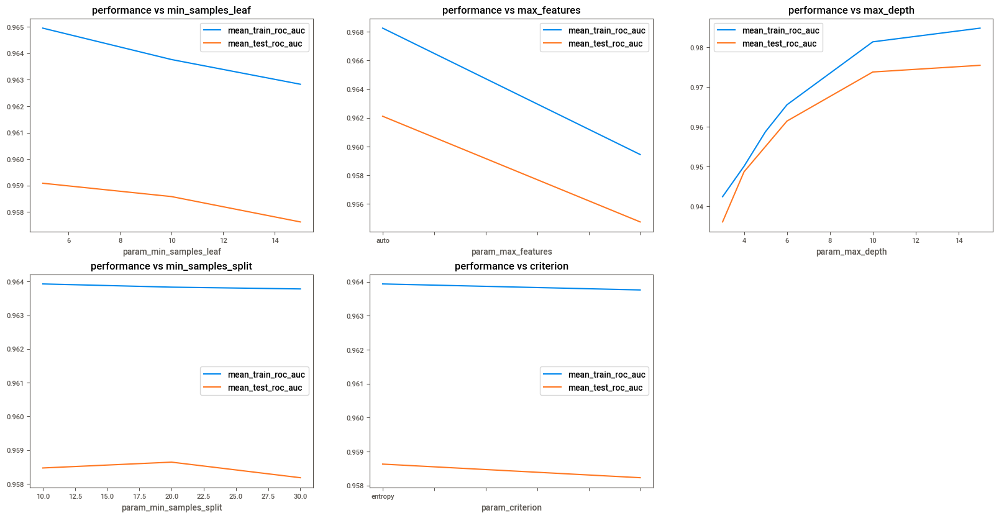

In [46]:
# grid search performance plots
features = ["min_samples_leaf", "max_features", "max_depth", "min_samples_split",
            "criterion"]
plt.figure(figsize=(20, 10))
for i, f in enumerate(features):
    ax=plt.subplot(2,3,i+1)
    cvdf.groupby('param_%s'%f)['mean_train_roc_auc', 'mean_test_roc_auc'].mean().plot(ax=ax)
    ax.set_title("performance vs %s"%f)
plt.show()



1. Performance is good when `"min_samples_leaf"` is below 6
1. Performance is good when ` "max_features"` is set to `auto`
1. Performance is increasing when we are increasing `"max_depth"`. But the slop of the curve is decreasing. If we consider simplicity, with depth 10 we have decent score.
1. Performance is best when `min_samples_split` is 20. 
1. `entropy` is provising best performance over `gini`



## Finetuning - Grid Search CV

In [47]:
# decision tree parameter grids
parameters = {
              'max_depth':[8, 9, 10, 11, 12],
              'min_samples_leaf' : [1, 2, 3, 4, 5],
              'min_samples_split' : [11, 15, 20, 25, 28],
              }

# prepare grid search object
dt5 = DecisionTreeClassifier(random_state=0, 
                             class_weight='balanced',
                             criterion='entropy',
                             max_features='auto',
                             )
gridcv_dt2 = GridSearchCV(dt5, parameters, cv=11, 
                        scoring = ['roc_auc', 'accuracy', 'recall', 'precision'], 
                        refit='roc_auc',
                        error_score='raise', verbose=3, return_train_score=True)

In [48]:
# Perform the grid search
res_gridcv_dt2 = gridcv_dt2.fit(X, y)
dump(gridcv_dt2, root % 'gridcv_dt2.joblib')
dump(res_gridcv_dt2, root % 'res_gridcv_dt2.joblib')

Fitting 11 folds for each of 125 candidates, totalling 1375 fits
[CV 1/11] END max_depth=8, min_samples_leaf=1, min_samples_split=11; accuracy: (train=0.927, test=0.914) precision: (train=0.927, test=0.914) recall: (train=0.903, test=0.888) roc_auc: (train=0.981, test=0.978) total time=   0.0s
[CV 2/11] END max_depth=8, min_samples_leaf=1, min_samples_split=11; accuracy: (train=0.923, test=0.919) precision: (train=0.910, test=0.915) recall: (train=0.915, test=0.899) roc_auc: (train=0.980, test=0.974) total time=   0.0s
[CV 3/11] END max_depth=8, min_samples_leaf=1, min_samples_split=11; accuracy: (train=0.926, test=0.912) precision: (train=0.940, test=0.938) recall: (train=0.886, test=0.854) roc_auc: (train=0.979, test=0.970) total time=   0.0s
[CV 4/11] END max_depth=8, min_samples_leaf=1, min_samples_split=11; accuracy: (train=0.927, test=0.942) precision: (train=0.911, test=0.931) recall: (train=0.923, test=0.938) roc_auc: (train=0.982, test=0.984) total time=   0.0s
[CV 5/11] END m

['/content/drive/MyDrive/TechGig_HPE_ML_2022/res_gridcv_dt2.joblib']

In [49]:
# load the model
gridcv_dt2 = load(root % 'gridcv_dt2.joblib')
res_gridcv_dt2 = load(root % 'res_gridcv_dt2.joblib')

In [50]:
# grid search result
cvdf2 = pd.DataFrame(gridcv_dt2.cv_results_)
cvdf2.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_roc_auc,split1_test_roc_auc,split2_test_roc_auc,split3_test_roc_auc,split4_test_roc_auc,split5_test_roc_auc,split6_test_roc_auc,split7_test_roc_auc,split8_test_roc_auc,split9_test_roc_auc,split10_test_roc_auc,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,split0_train_roc_auc,split1_train_roc_auc,split2_train_roc_auc,split3_train_roc_auc,split4_train_roc_auc,split5_train_roc_auc,split6_train_roc_auc,split7_train_roc_auc,split8_train_roc_auc,split9_train_roc_auc,split10_train_roc_auc,mean_train_roc_auc,std_train_roc_auc,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,split5_test_accuracy,split6_test_accuracy,split7_test_accuracy,split8_test_accuracy,split9_test_accuracy,split10_test_accuracy,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,split0_train_accuracy,split1_train_accuracy,split2_train_accuracy,split3_train_accuracy,split4_train_accuracy,split5_train_accuracy,split6_train_accuracy,split7_train_accuracy,split8_train_accuracy,split9_train_accuracy,split10_train_accuracy,mean_train_accuracy,std_train_accuracy,split0_test_recall,split1_test_recall,split2_test_recall,split3_test_recall,split4_test_recall,split5_test_recall,split6_test_recall,split7_test_recall,split8_test_recall,split9_test_recall,split10_test_recall,mean_test_recall,std_test_recall,rank_test_recall,split0_train_recall,split1_train_recall,split2_train_recall,split3_train_recall,split4_train_recall,split5_train_recall,split6_train_recall,split7_train_recall,split8_train_recall,split9_train_recall,split10_train_recall,mean_train_recall,std_train_recall,split0_test_precision,split1_test_precision,split2_test_precision,split3_test_precision,split4_test_precision,split5_test_precision,split6_test_precision,split7_test_precision,split8_test_precision,split9_test_precision,split10_test_precision,mean_test_precision,std_test_precision,rank_test_precision,split0_train_precision,split1_train_precision,split2_train_precision,split3_train_precision,split4_train_precision,split5_train_precision,split6_train_precision,split7_train_precision,split8_train_precision,split9_train_precision,split10_train_precision,mean_train_precision,std_train_precision
0,0.009732,0.002263,0.009060,0.002076,8,1,11,"{'max_depth': 8, 'min_samples_leaf': 1, 'min_samples_split': 11}",0.977649,0.974106,0.969773,0.984091,0.969142,0.987939,0.969849,0.981978,0.933547,0.976329,0.973124,0.972503,0.013651,124,0.980610,0.979582,0.979064,0.982137,0.976915,0.983889,0.980738,0.980071,0.982292,0.978780,0.984504,0.980780,0.002164,0.914110,0.918919,0.911548,0.942260,0.907862,0.939803,0.901720,0.931204,0.886978,0.914005,0.912776,0.916472,0.015503,123,0.926658,0.923474,0.925562,0.926790,0.925808,0.928510,0.926176,0.927773,0.929124,0.924702,0.927282,0.926533,0.001570,0.887955,0.899160,0.854342,0.938375,0.834734,0.921348,0.926966,0.912921,0.811798,0.873596,0.935393,0.890599,0.040531,120,0.903199,0.915264,0.886364,0.922559,0.870932,0.902945,0.928191,0.899018,0.896494,0.893969,0.941374,0.905483,0.019110,0.913545,0.91453,0.938462,0.930556,0.949045,0.939828,0.859375,0.928571,0.920382,0.925595,0.874016,0.917628,0.026274,66,0.927398,0.910410,0.940179,0.911308,0.955665,0.931693,0.905583,0.933586,0.938895,0.931327,0.897566,0.925783,0.016655
1,0.009199,0.000688,0.008307,0.000471,8,1,15,"{'max_depth': 8, 'min_samples_leaf': 1, 'min_samples_split': 15}",0.980282,0.979908,0.971737,0.979675,0.971973,0.984265,0.974658,0.981907,0.945418,0.963600,0.967154,0.972780,0.010616,120,0.981599,0.981203,0.978879,0.978912,0.978126,0.979771,0.977854,0.981239,0.982152,0.982307,0.979482,0.980138,0.001542,0.925153,0.921376,0.916462,0.931204,0.900491,0.929975,0.907862,0.931204,0.916462,0.921376,0.927518,0.920826,0.009453,110,0.927396,0.928264,0.921631,0.928756,0.922860,0.923105,0.919543,0.925071,0.930230,0.926790,0.922614,0.925114,0.00

In [51]:
# best model
gridcv_dt2.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=12, max_features='auto', min_samples_leaf=2,
                       min_samples_split=25, random_state=0)

In [52]:
# plot the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=[400, 25])
plot_tree(gridcv_dt2.best_estimator_)
plt.show()

In [53]:
# best score
gridcv_dt.best_score_, gridcv_dt2.best_score_

(0.9807807869139339, 0.9815851299021262)

- Performance improved a bit

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  import sys


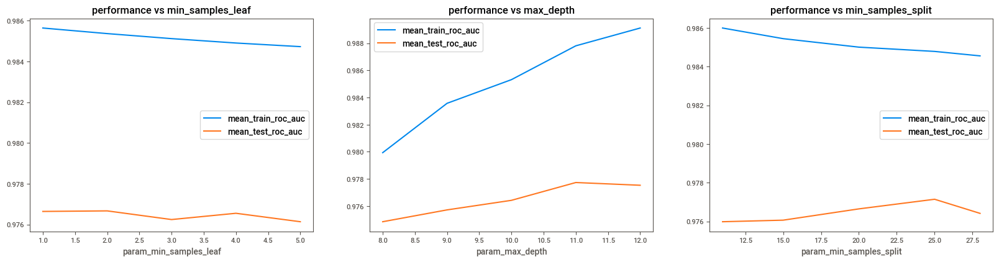

In [54]:
# grid search performance plots

features = ["min_samples_leaf",  "max_depth", "min_samples_split"]
plt.figure(figsize=(20, 10))
for i, f in enumerate(features):
    ax=plt.subplot(2,3,i+1)
    cvdf2.groupby('param_%s'%f)['mean_train_roc_auc', 'mean_test_roc_auc'].mean().plot(ax=ax)
    ax.set_title("performance vs %s"%f)
plt.show()

1. Performance is good when `"min_samples_leaf"` is `4`
1. Performance is best when `"max_depth"` is `10`
1. Performance is best when `"min_samples_split"` is `25`


In [55]:
# prepare grid search object
dt6 = DecisionTreeClassifier(random_state=0, 
                            class_weight='balanced',
                            criterion='entropy',
                            max_features='auto',
                            min_samples_leaf=4,
                            max_depth=10,
                            min_samples_split=25)


In [56]:
# fit and save the model and results
res_dt6 = dt6.fit(X, y)
# save the model
dump(dt6, root % 'dt6.joblib')
dump(res_dt6, root % 'res_dt6.joblib')

['/content/drive/MyDrive/TechGig_HPE_ML_2022/res_dt6.joblib']

In [57]:
# load the model
dt6 = load(root % 'dt6.joblib')
res_dt6 = load(root % 'res_dt6.joblib')

## Feature Importance

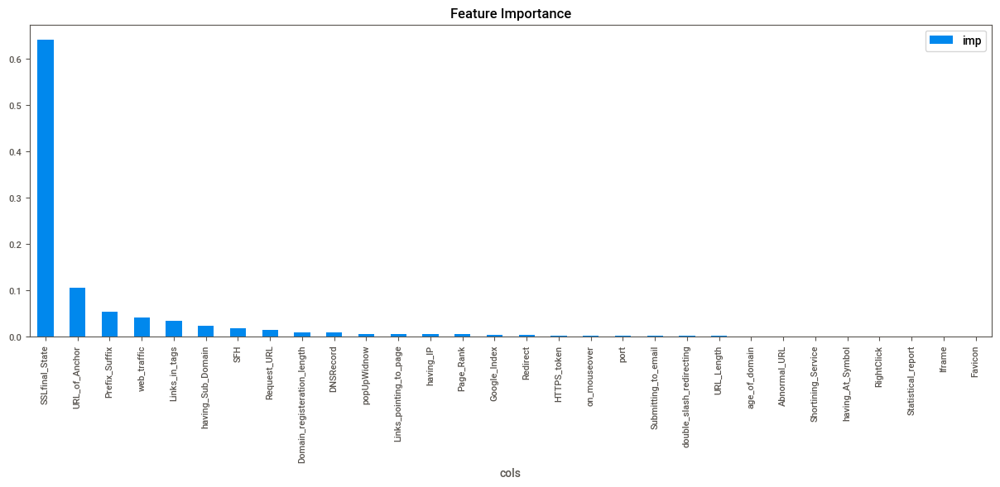

In [58]:
# feature importance
fdf = pd.DataFrame(dict(imp=dt6.feature_importances_, cols=X.columns))\
            .sort_values(by="imp", ascending=False)
fdf.plot.bar(x='cols', title="Feature Importance", figsize=[15, 5])
plt.show()

In [59]:
# top 5 features
fdf.head()

,imp,cols
7,0.641890,SSLfinal_State
13,0.104994,URL_of_Anchor
5,0.053972,Prefix_Suffix
25,0.042104,web_traffic
14,0.035136,Links_in_tags


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


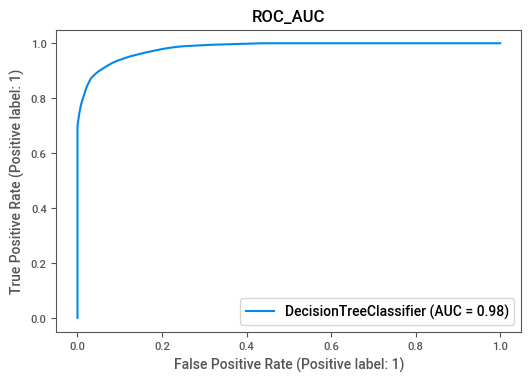

In [60]:
# ROC - AUC
from sklearn import metrics 

metrics.plot_roc_curve(dt6, X, y)
plt.title("ROC_AUC")
plt.show()

## Finding the probability cutoff

In [61]:
# calculate probability values
y_train_proba =pd.Series(dt6.predict_proba(X)[:, 1])

# prepare a dataframe
y_train_final = pd.DataFrame(columns=['phishing', 'proba'])

y_train_final['phishing'] = np.array(y)
y_train_final['proba'] = y_train_proba
# calculate prediction for different probability values
cutoff_range= np.arange(0, 1.001, 0.001)
for i in cutoff_range:
    y_train_final[f"{round(i,2)}"] = y_train_proba.apply(lambda x: 1 if x >= i else 0)
y_train_final.head()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  if sys.path[0] == '':


,phishing,proba,0.0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15,0.16,0.17,0.18,0.19,0.2,0.21,0.22,0.23,0.24,0.25,0.26,0.27,0.28,0.29,0.3,0.31,0.32,0.33,0.34,0.35,0.36,0.37,0.38,0.39,0.4,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48,0.49,0.5,0.51,0.52,0.53,0.54,0.55,0.56,0.57,0.58,0.59,0.6,0.61,0.62,0.63,0.64,0.65,0.66,0.67,0.68,0.69,0.7,0.71,0.72,0.73,0.74,0.75,0.76,0.77,0.78,0.79,0.8,0.81,0.82,0.83,0.84,0.85,0.86,0.87,0.88,0.89,0.9,0.91,0.92,0.93,0.94,0.95,0.96,0.97,0.98,0.99,1.0
0,1,1.000000,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
1,1,0.868070,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1.000000,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,1,0.823966,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.240302,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [62]:
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['cutoff', 'accuracy', 'sensi', 'speci','false negative rate', 'false positive rate'])
for i in cutoff_range:
    cm1 = metrics.confusion_matrix(y_train_final["phishing"], y_train_final[f"{round(i,2)}"] )
    total1=sum(sum(cm1))
    # metrics
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    false_negative_rate = 1-sensi
    false_positive_rate = 1-speci
    # update dataframe
    cutoff_df.loc[i] =[i, accuracy, sensi, speci, false_negative_rate, false_positive_rate]
cutoff_df.sample(10)

,cutoff,accuracy,sensi,speci,false negative rate,false positive rate
0.611,0.611,0.926410,0.876052,0.965634,0.123948,0.034366
0.359,0.359,0.918816,0.936751,0.904847,0.063249,0.095153
0.342,0.342,0.910218,0.950523,0.878824,0.049477,0.121176
0.086,0.086,0.854495,0.989033,0.749702,0.010967,0.250298
0.318,0.318,0.909548,0.951543,0.876838,0.048457,0.123162
0.253,0.253,0.895254,0.965825,0.840286,0.034175,0.159714
0.197,0.197,0.874819,0.980872,0.792213,0.019128,0.207787
0.224,0.224,0.878839,0.978322,0.801351,0.021678,0.198649
0.874,0.874,0.894026,0.767151,0.992849,0.232849,0.007151
0.219,0.219,0.878839,0.978322,0.801351,0.021678,0.198649


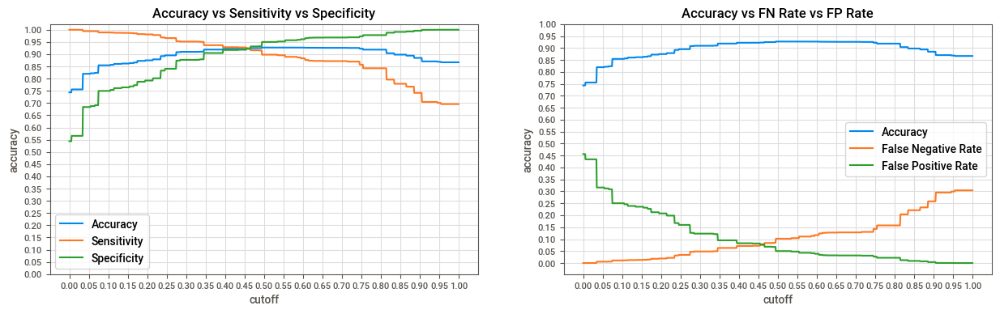

In [63]:
# metric comparison polt
plt.figure(figsize=[15, 9])
ax = plt.subplot(2,2,1)
ax.set_title("Accuracy vs Sensitivity vs Specificity")
sns.lineplot(data=cutoff_df, x="cutoff", y="accuracy", label="Accuracy")
sns.lineplot(data=cutoff_df, x="cutoff", y="sensi", label="Sensitivity")
sns.lineplot(data=cutoff_df, x="cutoff", y="speci", label="Specificity")
ax.set_xticks(np.arange(0, 1.05, 0.05))
ax.set_yticks(np.arange(0, 1.05, 0.05))
ax.grid(visible=True, color="#dddddd")
ax = plt.subplot(2,2,2)
ax.set_title("Accuracy vs FN Rate vs FP Rate")
sns.lineplot(data=cutoff_df, x="cutoff", y="accuracy", label="Accuracy")
sns.lineplot(data=cutoff_df, x="cutoff", y="false negative rate", label="False Negative Rate")
sns.lineplot(data=cutoff_df, x="cutoff", y="false positive rate", label="False Positive Rate")
ax.grid(visible=True, color="#dddddd")
ax.set_xticks(np.arange(0, 1.05, 0.05))
ax.set_yticks(np.arange(0, 1.05, 0.05))
plt.show()

### Optimal `probability cutoff` for prediction

In [64]:
# optimal cutoff finding
closest = np.argmin(np.array(cutoff_df["false positive rate"] - cutoff_df["false negative rate"])**2)
optimal = pd.DataFrame(cutoff_df.iloc[closest]).T
optimal

,cutoff,accuracy,sensi,speci,false negative rate,false positive rate
0.455,0.455,0.92306,0.924764,0.921732,0.075236,0.078268


In [65]:
# optimal values
optimal = round(optimal, 3)
print("Optimal Probability cutoff: ", optimal['cutoff'].values)
print("Accuracy at optimal cutoff: ", optimal['accuracy'].values)
print("Sensitivity at optimal cutoff: ", optimal['sensi'].values)
print("Specificity at optimal cutoff: ", optimal['speci'].values)
print("FNR at optimal cutoff: ", optimal['false negative rate'].values)
print("FPR at optimal cutoff: ", optimal['false positive rate'].values)

Optimal Probability cutoff:  [0.455]
Accuracy at optimal cutoff:  [0.923]
Sensitivity at optimal cutoff:  [0.925]
Specificity at optimal cutoff:  [0.922]
FNR at optimal cutoff:  [0.075]
FPR at optimal cutoff:  [0.078]




```
Optimal Probability cutoff:  [0.455]
Accuracy at optimal cutoff:  [0.923]
Sensitivity at optimal cutoff:  [0.925]
Specificity at optimal cutoff:  [0.922]
FNR at optimal cutoff:  [0.075]
FPR at optimal cutoff:  [0.078]
```



## Analytics Decision on `cutoff`

- As we want to correctly predict the `phising` site, we should keep the **`FNR`** to **as low as possible**.
- While considering the **Accuracy** in mind

In [66]:
# choose a cutoff = 0.25
my_options = pd.DataFrame(cutoff_df.loc[0.25]).T
my_options

,cutoff,accuracy,sensi,speci,false negative rate,false positive rate
0.25,0.25,0.895254,0.965825,0.840286,0.034175,0.159714


In [67]:
# My values
my_options = round(my_options, 3)
print("Our Probability cutoff: ", my_options['cutoff'].values)
print("Accuracy at our cutoff: ", my_options['accuracy'].values)
print("Sensitivity at our cutoff: ", my_options['sensi'].values)
print("Specificity at our cutoff: ", my_options['speci'].values)
print("FNR at our cutoff: ", my_options['false negative rate'].values)
print("FPR at our cutoff: ", my_options['false positive rate'].values)

Our Probability cutoff:  [0.25]
Accuracy at our cutoff:  [0.895]
Sensitivity at our cutoff:  [0.966]
Specificity at our cutoff:  [0.84]
FNR at our cutoff:  [0.034]
FPR at our cutoff:  [0.16]


```
Our Probability cutoff:  [0.25]
Accuracy at our cutoff:  [0.895]
Sensitivity at our cutoff:  [0.966]
Specificity at our cutoff:  [0.84]
FNR at our cutoff:  [0.034]
FPR at our cutoff:  [0.16]
```



## Generate prediction for `test` data

In [69]:
# drop key column
test_key = test['key']
test.drop(columns=['key'], inplace=True)
test.head()

,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report
0,1,1,1,1,1,1,-1,1,-1,1,1,1,1,0,0,1,1,1,0,1,1,1,1,1,1,1,1,-1,0,1
1,1,-1,1,1,1,-1,0,-1,1,1,1,1,1,-1,-1,-1,1,1,0,1,1,1,1,-1,-1,0,-1,-1,0,1
2,1,-1,1,1,1,-1,0,0,-1,-1,-1,1,-1,-1,-1,-1,-1,1,0,-1,-1,-1,-1,1,-1,1,-1,1,1,-1
3,-1,-1,-1,1,-1,-1,-1,-1,1,-1,-1,-1,-1,-1,1,-1,-1,-1,1,-1,1,-1,-1,1,-1,1,-1,1,1,-1
4,1,-1,1,1,1,-1,1,1,-1,1,1,1,1,0,1,-1,1,1,0,1,1,1,1,1,1,1,-1,1,0,1


In [70]:
# perform ordinal encoding
enc_test_arr = enc.transform(test)
test_enc = test.copy()
# encode
test_enc.loc[:,:] = enc_test_arr
test_enc.head()

,having_IP,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,port,HTTPS_token,Request_URL,URL_of_Anchor,Links_in_tags,SFH,Submitting_to_email,Abnormal_URL,Redirect,on_mouseover,RightClick,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report
0,1.0,2.0,1.0,1.0,1.0,1.0,0.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0
1,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0
2,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,2.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,2.0,0.0
4,1.0,0.0,1.0,1.0,1.0,0.0,2.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0


In [71]:
# run prediction on test data
y_test_proba = pd.Series(dt6.predict_proba(test_enc)[:, 1])

In [73]:
dump(y_test_proba, root % 'y_test_proba.joblib')

['/content/drive/MyDrive/TechGig_HPE_ML_2022/y_test_proba.joblib']

## Prepare for submission
**cutoff=0.25**

In [103]:
# choosing cutoff= 0.25
submit = pd.DataFrame(dict(key=test_key, 
                  Result=y_test_proba.apply(lambda proba: -1 if proba >= 0.25 else 1))
)
submit.head(10)

,key,Result
0,21338,1
1,21339,-1
2,21340,-1
3,21341,-1
4,21342,1
5,21343,1
6,21344,1
7,21345,1
8,21346,-1
9,21347,1


In [86]:
# save the result
submit.to_csv("submission.csv")

In [90]:
# saving the encoder
dump(enc, root % 'enc.joblib')

['/content/drive/MyDrive/TechGig_HPE_ML_2022/enc.joblib']

In [112]:
import joblib
joblib.__version__

'1.1.0'

# Final model

- Our final model is saved at `dt6.joblib` file
- Our feature encoder object is saved at `enc.joblib` file

# Prediction Function

- Use below function to run the prediction.
- Make sure to save `model file` and `feature encoder file`.
- Currently the model file name is: `dt6.joblib`
- Currently the feature encoder file name is: `enc.joblib`
- `Joblib version: 1.1.0`

In [106]:
root = "/content/drive/MyDrive/TechGig_HPE_ML_2022/%s"
def predict(features, p=0.25):
    """Use this function to predict """
    # load the model
    model = load(root % 'dt6.joblib')
    # load encoder
    enc = load(root % 'enc.joblib')
    encoded = enc.transform(features)
    # display(encoded)
    # run probability
    proba = pd.Series(model.predict_proba(encoded)[:, 1])
    # display()
    # generate and return result
    return proba.apply(lambda x: -1 if x >= p else 1)

# run prediction
predict(test.iloc[:1, :], p=0.25)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


0    1
dtype: int64

# <center>THE END</center>